### In the following project, I will analyze a used cars dataset and train three different models to try and predict the price of used cars given many attributes of the car such as the horsepower, enginesize, origin, etc.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px # interactive data visualization

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 

In [2]:
cars = pd.read_csv('CARS.csv')

### First off, to clean and visualize some data.

In [3]:
cars.head(10)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,"$36,945","$33,337",3.5,6.0,265,17,23,4451,106,189
1,Acura,RSX Type S 2dr,Sedan,Asia,Front,"$23,820","$21,761",2.0,4.0,200,24,31,2778,101,172
2,Acura,TSX 4dr,Sedan,Asia,Front,"$26,990","$24,647",2.4,4.0,200,22,29,3230,105,183
3,Acura,TL 4dr,Sedan,Asia,Front,"$33,195","$30,299",3.2,6.0,270,20,28,3575,108,186
4,Acura,3.5 RL 4dr,Sedan,Asia,Front,"$43,755","$39,014",3.5,6.0,225,18,24,3880,115,197
5,Acura,3.5 RL w/Navigation 4dr,Sedan,Asia,Front,"$46,100","$41,100",3.5,6.0,225,18,24,3893,115,197
6,Acura,NSX coupe 2dr manual S,Sports,Asia,Rear,"$89,765","$79,978",3.2,6.0,290,17,24,3153,100,174
7,Audi,A4 1.8T 4dr,Sedan,Europe,Front,"$25,940","$23,508",1.8,4.0,170,22,31,3252,104,179
8,Audi,A41.8T convertible 2dr,Sedan,Europe,Front,"$35,940","$32,506",1.8,4.0,170,23,30,3638,105,180
9,Audi,A4 3.0 4dr,Sedan,Europe,Front,"$31,840","$28,846",3.0,6.0,220,20,28,3462,104,179


In [4]:
cars.tail(10)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
418,Volvo,S60 2.5 4dr,Sedan,Europe,All,"$31,745","$29,916",2.5,5.0,208,20,27,3903,107,180
419,Volvo,S60 T5 4dr,Sedan,Europe,Front,"$34,845","$32,902",2.3,5.0,247,20,28,3766,107,180
420,Volvo,S60 R 4dr,Sedan,Europe,All,"$37,560","$35,382",2.5,5.0,300,18,25,3571,107,181
421,Volvo,S80 2.9 4dr,Sedan,Europe,Front,"$37,730","$35,542",2.9,6.0,208,20,28,3576,110,190
422,Volvo,S80 2.5T 4dr,Sedan,Europe,All,"$37,885","$35,688",2.5,5.0,194,20,27,3691,110,190
423,Volvo,C70 LPT convertible 2dr,Sedan,Europe,Front,"$40,565","$38,203",2.4,5.0,197,21,28,3450,105,186
424,Volvo,C70 HPT convertible 2dr,Sedan,Europe,Front,"$42,565","$40,083",2.3,5.0,242,20,26,3450,105,186
425,Volvo,S80 T6 4dr,Sedan,Europe,Front,"$45,210","$42,573",2.9,6.0,268,19,26,3653,110,190
426,Volvo,V40,Wagon,Europe,Front,"$26,135","$24,641",1.9,4.0,170,22,29,2822,101,180
427,Volvo,XC70,Wagon,Europe,All,"$35,145","$33,112",2.5,5.0,208,20,27,3823,109,186


In [5]:
cars.columns

Index(['Make', 'Model', 'Type', 'Origin', 'DriveTrain', 'MSRP', 'Invoice',
       'EngineSize', 'Cylinders', 'Horsepower', 'MPG_City', 'MPG_Highway',
       'Weight', 'Wheelbase', 'Length'],
      dtype='object')

In [6]:
cars.shape

(428, 15)

In [7]:
import pandas_profiling as pp

report = pp.ProfileReport(cars)
display(report)

/var/folders/z3/nr4tym2s3v17r9yd_1z14x_80000gn/T/ipykernel_11896/2416481031.py:1: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
cars.isnull().sum()

Make           0
Model          0
Type           0
Origin         0
DriveTrain     0
MSRP           0
Invoice        0
EngineSize     0
Cylinders      2
Horsepower     0
MPG_City       0
MPG_Highway    0
Weight         0
Wheelbase      0
Length         0
dtype: int64

In [9]:
cars = cars.dropna()

In [10]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 0 to 427
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         426 non-null    object 
 1   Model        426 non-null    object 
 2   Type         426 non-null    object 
 3   Origin       426 non-null    object 
 4   DriveTrain   426 non-null    object 
 5   MSRP         426 non-null    object 
 6   Invoice      426 non-null    object 
 7   EngineSize   426 non-null    float64
 8   Cylinders    426 non-null    float64
 9   Horsepower   426 non-null    int64  
 10  MPG_City     426 non-null    int64  
 11  MPG_Highway  426 non-null    int64  
 12  Weight       426 non-null    int64  
 13  Wheelbase    426 non-null    int64  
 14  Length       426 non-null    int64  
dtypes: float64(2), int64(6), object(7)
memory usage: 53.2+ KB


In [11]:
cars.describe(include='all').round(2).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Make,426,38,Toyota,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model,426,423,C240 4dr,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,426,6,Sedan,262,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Origin,426,3,Asia,156,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DriveTrain,426,3,Front,226,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSRP,426,409,"$33,995",2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Invoice,426,423,"$19,638",2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EngineSize,426.0,NaN,NaN,NaN,3.21,1.1,1.4,2.4,3.0,3.9,8.3
Cylinders,426.0,NaN,NaN,NaN,5.81,1.56,3.0,4.0,6.0,6.0,12.0
Horsepower,426.0,NaN,NaN,NaN,215.88,71.99,73.0,165.0,210.0,255.0,500.0


### Cleaning up MSRP and Invoice column

In [12]:
cars.head(1)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,"$36,945","$33,337",3.5,6.0,265,17,23,4451,106,189


In [13]:
pd.set_option('mode.chained_assignment', None) # to surpress warning

# Convert MSRP and Invoice datatype to integer so we need to remove $ sign and comma (,) from these 2 columns
cars['MSRP'] = cars['MSRP'].str.replace('$','', regex=True)
cars['MSRP'] = cars['MSRP'].str.replace(',','', regex=True)
cars['MSRP'] = cars['MSRP'].astype('int')

In [14]:
cars['Invoice'] = cars['Invoice'].str.replace('$', '', regex=True)
cars['Invoice'] = cars['Invoice'].str.replace(',', '', regex=True)
cars['Invoice'] = cars['Invoice'].astype('int')
cars.head(1)

,Make,Model,Type,Origin,DriveTrain,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,Acura,MDX,SUV,Asia,All,36945,33337,3.5,6.0,265,17,23,4451,106,189


In [15]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 0 to 427
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         426 non-null    object 
 1   Model        426 non-null    object 
 2   Type         426 non-null    object 
 3   Origin       426 non-null    object 
 4   DriveTrain   426 non-null    object 
 5   MSRP         426 non-null    int64  
 6   Invoice      426 non-null    int64  
 7   EngineSize   426 non-null    float64
 8   Cylinders    426 non-null    float64
 9   Horsepower   426 non-null    int64  
 10  MPG_City     426 non-null    int64  
 11  MPG_Highway  426 non-null    int64  
 12  Weight       426 non-null    int64  
 13  Wheelbase    426 non-null    int64  
 14  Length       426 non-null    int64  
dtypes: float64(2), int64(8), object(5)
memory usage: 53.2+ KB


In [16]:
cars.describe(include='all').round(2).T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Make,426,38,Toyota,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Model,426,423,C240 4dr,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Type,426,6,Sedan,262,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Origin,426,3,Asia,156,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DriveTrain,426,3,Front,226,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MSRP,426.0,NaN,NaN,NaN,32804.55,19472.46,10280.0,20324.75,27807.5,39225.0,192465.0
Invoice,426.0,NaN,NaN,NaN,30040.65,17679.43,9875.0,18836.0,25521.5,35754.75,173560.0
EngineSize,426.0,NaN,NaN,NaN,3.21,1.1,1.4,2.4,3.0,3.9,8.3
Cylinders,426.0,NaN,NaN,NaN,5.81,1.56,3.0,4.0,6.0,6.0,12.0
Horsepower,426.0,NaN,NaN,NaN,215.88,71.99,73.0,165.0,210.0,255.0,500.0


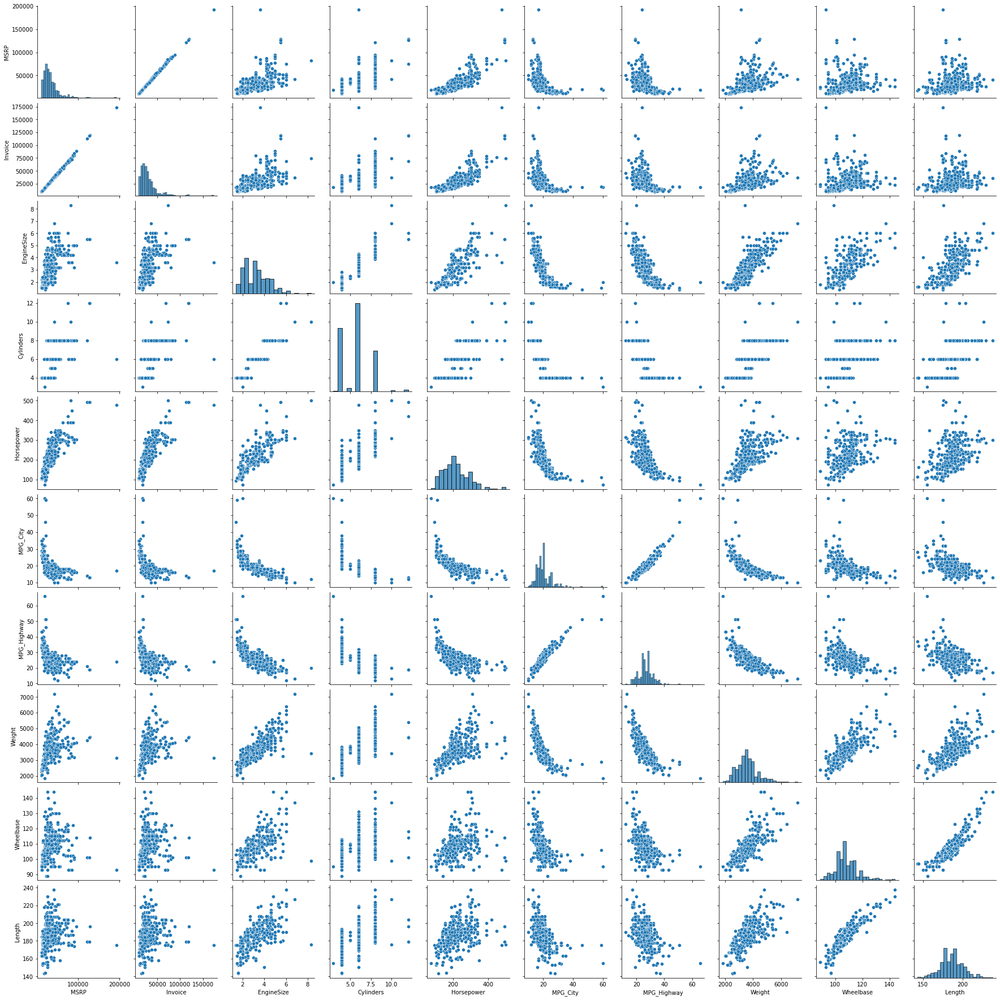

In [17]:
sns.pairplot(data=cars);

In [18]:
cars['Make'].unique()

array(['Acura', 'Audi', 'BMW', 'Buick', 'Cadillac', 'Chevrolet',
       'Chrysler', 'Dodge', 'Ford', 'GMC', 'Honda', 'Hummer', 'Hyundai',
       'Infiniti', 'Isuzu', 'Jaguar', 'Jeep', 'Kia', 'Land Rover',
       'Lexus', 'Lincoln', 'MINI', 'Mazda', 'Mercedes-Benz', 'Mercury',
       'Mitsubishi', 'Nissan', 'Oldsmobile', 'Pontiac', 'Porsche', 'Saab',
       'Saturn', 'Scion', 'Subaru', 'Suzuki', 'Toyota', 'Volkswagen',
       'Volvo'], dtype=object)

In [19]:
fig = px.histogram(data_frame=cars,
                              x='Make',
                              labels={'Make': 'Manufacturer'},
                              title='Make of the Car',
                              color_discrete_sequence=['blue']).update_xaxes(categoryorder='total descending')
fig.show();

In [20]:
fig = px.histogram(data_frame=cars,
                  x='Type',
                  labels={'Type', 'Type'},
                  title='Type of the Car',
                  color_discrete_sequence=['blue']).update_xaxes(categoryorder='total descending') # with decending order

fig.show();

In [21]:
fig = px.histogram(data_frame=cars,
                  x='Origin',
                  labels={'Origin':'Location'},
                  title='Origin/Location of the Car Sales',
                  color_discrete_sequence=['blue']).update_xaxes(categoryorder='total descending')

fig.show();

In [22]:
fig = px.histogram(data_frame=cars,
                  x='DriveTrain',
                  labels={'DriveTrain': 'DriveTrain'},
                  title='DriveTrain of the Car',
                  color_discrete_sequence=['blue']).update_xaxes(categoryorder='total descending')

fig.show();

In [23]:
fig = px.histogram(data_frame=cars,
                  x='Make',
                  color='Origin',
                  labels={'Make': 'Manufacturer'},
                  title='Make of the Car Vs Location')

fig.show();

In [24]:
fig = px.histogram(data_frame=cars,
                  x='Make',
                  color='Type',
                  labels={'Make', 'Manufacturer'},
                  title='Make of the Car Vs Type')

fig.show();

#### Based on these charts, we can see stats like Porsche has produced the highest number of sports cars and Honda and Toyota are the only two with Hybrid car types.

In [25]:
carsforPCA = cars
carsforPCA = carsforPCA.drop(['Model','Make','Type', 'Origin', 'DriveTrain'],axis = 1)
carsforPCA

,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
0,36945,33337,3.5,6.0,265,17,23,4451,106,189
1,23820,21761,2.0,4.0,200,24,31,2778,101,172
2,26990,24647,2.4,4.0,200,22,29,3230,105,183
3,33195,30299,3.2,6.0,270,20,28,3575,108,186
4,43755,39014,3.5,6.0,225,18,24,3880,115,197
...,...,...,...,...,...,...,...,...,...,...
423,40565,38203,2.4,5.0,197,21,28,3450,105,186
424,42565,40083,2.3,5.0,242,20,26,3450,105,186
425,45210,42573,2.9,6.0,268,19,26,3653,110,190
426,26135,24641,1.9,4.0,170,22,29,2822,101,180


In [26]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaled_X = scaler.fit_transform(carsforPCA)
scaled_X

array([[ 0.2128811 ,  0.18667009,  0.26706567, ...,  1.14697157,
        -0.26012678,  0.17978113],
       [-0.46194024, -0.46887201, -1.09381919, ..., -1.05730932,
        -0.86107044, -1.00490946],
       [-0.29895481, -0.30543952, -0.73091656, ..., -0.46177139,
        -0.38031551, -0.23834496],
       ...,
       [ 0.63782574,  0.70969937, -0.27728827, ...,  0.09555725,
         0.22062814,  0.24946881],
       [-0.34291461, -0.3057793 , -1.18454484, ..., -0.9993366 ,
        -0.86107044, -0.447408  ],
       [ 0.12033418,  0.17392847, -0.6401909 , ...,  0.31954276,
         0.10043941, -0.02928191]])

In [27]:
scaled_X.mean(axis=0)

array([ 9.17367382e-17,  6.67176278e-17,  2.58530808e-16, -9.17367382e-17,
       -1.25095552e-16, -5.83779243e-17,  2.66870511e-16, -1.91813180e-16,
        3.16908732e-16, -1.33435256e-16])

In [28]:
# as we are only interested in covariance across the features, not each rows, we put rowvar=False
covariance_matrix = np.cov(scaled_X, rowvar=False)
# Get Eigen Vectors and Eigen Values
eigen_values , eigen_vectors = np.linalg.eig(covariance_matrix)
eigen_vectors

array([[-2.77898131e-01,  4.81583589e-01, -2.07518102e-01,
        -3.00927722e-01,  5.96659098e-02,  7.09307862e-01,
         1.84214747e-01, -1.26283813e-01, -2.53119372e-02,
         5.25213272e-03],
       [-2.75910837e-01,  4.84491617e-01, -2.09217463e-01,
        -3.08097604e-01,  5.88314942e-02, -7.04656112e-01,
         1.83412172e-01, -1.19770005e-01, -4.95327044e-02,
         2.29208191e-03],
       [-3.61362577e-01, -5.00172698e-02, -7.37524916e-02,
         5.23069413e-01,  9.62251998e-03, -1.20305293e-02,
        -5.90314784e-03, -6.68442879e-01,  3.52731341e-01,
        -1.27933049e-01],
       [-3.53757441e-01,  5.39423705e-02, -1.04025664e-01,
         5.90208758e-01, -3.24724879e-02,  5.96403174e-03,
         3.74245428e-01,  4.05801058e-01, -4.49127800e-01,
         7.23755792e-02],
       [-3.41409622e-01,  2.66231412e-01, -6.12845570e-02,
         1.11889297e-01, -2.55804420e-01, -6.70306335e-04,
        -7.82064562e-01,  3.13423780e-01,  1.24153812e-01,
         7.

In [29]:
eigen_values

array([6.54285873e+00, 1.83900018e+00, 7.48671631e-01, 3.48210369e-01,
       2.09665656e-01, 8.11661980e-04, 1.30476287e-01, 7.17225679e-02,
       9.06071181e-02, 4.15052086e-02])

In our case, out of the 10 features, I'll choose 3 principal components.

In [30]:
# Choose som number of components
num_components = 2
sorted_key = np.argsort(eigen_values)[::-1][:num_components]
sorted_key

array([0, 1])

In [31]:
# Get num_components of Eigen Values and Eigen Vectors
# As we already have top 2 indexes, we gonna grab the values now
eigen_values, eigen_vectors = eigen_values[sorted_key], eigen_vectors[:, sorted_key]

In [32]:
# Dot product of original data and eigen_vectors are the principal component values
# This is the "projection" step of the original points on to the Principal Component
principal_components = np.dot(scaled_X, eigen_vectors)
principal_components

array([[-1.27013276e+00,  7.09826152e-02],
       [ 2.47925506e+00,  6.52255687e-01],
       [ 1.48427500e+00,  5.58480417e-02],
       [-2.32180656e-01,  2.64791694e-01],
       [-1.32089358e+00, -3.07740759e-01],
       [-1.39289307e+00, -1.96002725e-01],
       [-1.66267526e+00,  3.92339044e+00],
       [ 2.06510722e+00,  1.17531742e-01],
       [ 1.56214673e+00,  4.17307550e-01],
       [ 4.19615953e-01,  4.79899873e-01],
       [ 1.51473318e-02,  4.58668315e-01],
       [-2.98448701e-02,  4.97175896e-01],
       [-2.14490154e-01,  1.73652871e-03],
       [-6.86966529e-01,  1.05145623e-02],
       [-1.47710378e-01,  8.05830706e-01],
       [-5.30467565e-01,  7.85964864e-01],
       [-8.01300112e-01,  3.04617806e-01],
       [-2.40167379e+00,  7.17558840e-01],
       [-3.88696865e+00,  7.55821114e-01],
       [-2.45849283e+00,  1.44231345e+00],
       [-4.30826357e+00,  3.00521872e+00],
       [ 2.14395153e+00,  1.71478440e+00],
       [ 1.95130105e+00,  1.95749885e+00],
       [ 7.

Text(0, 0.5, 'Second Principal Component')

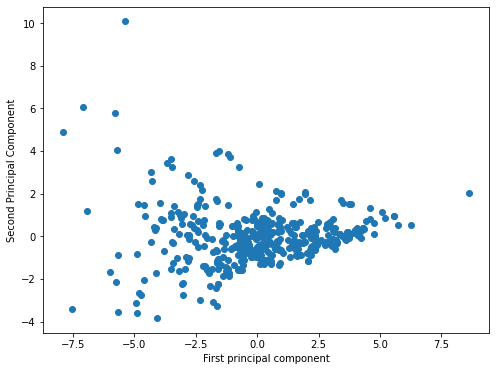

In [33]:
plt.figure(figsize=(8,6))
plt.scatter(principal_components[:,0],principal_components[:,1])
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [34]:
cars.keys()

Index(['Make', 'Model', 'Type', 'Origin', 'DriveTrain', 'MSRP', 'Invoice',
       'EngineSize', 'Cylinders', 'Horsepower', 'MPG_City', 'MPG_Highway',
       'Weight', 'Wheelbase', 'Length'],
      dtype='object')

Text(0, 0.5, 'Second Principal Component')

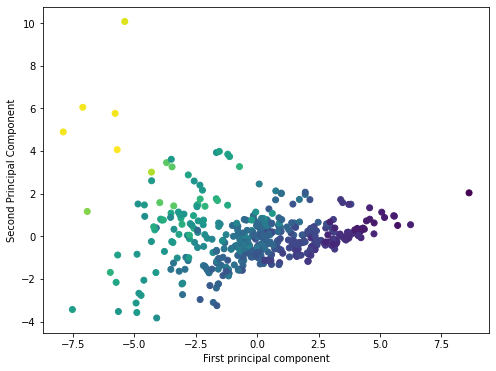

In [72]:
plt.figure(figsize=(8,6))
plt.scatter(principal_components[:,0],principal_components[:,1],c=cars['Horsepower'])
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

## Data Visualization with WordCloud

In [36]:
from wordcloud import WordCloud, STOPWORDS

In [37]:
text = cars['Model'].values
stopwords = STOPWORDS
text[:2]

array(['MDX', 'RSX Type S 2dr'], dtype=object)

In [38]:
wc = WordCloud(background_color='black',
              max_words=2000,
              max_font_size=100,
              random_state=3,
              stopwords=stopwords,
              contour_width=3).generate(str(text))

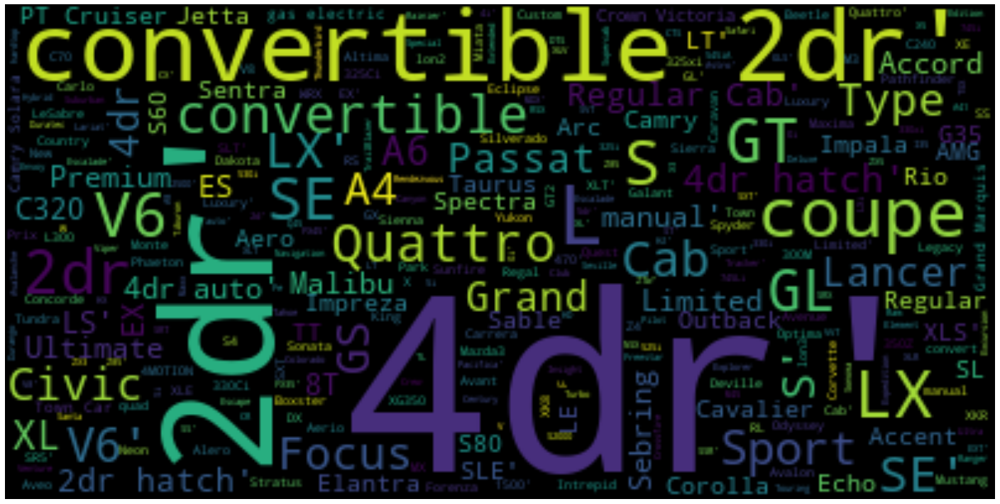

In [39]:
fig = plt.figure(figsize=(25, 15))

plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show();

In [40]:
cars.corr()

,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length
MSRP,1.000000,0.999132,0.573238,0.649742,0.827296,-0.475916,-0.440523,0.447987,0.151665,0.171060
Invoice,0.999132,1.000000,0.566019,0.645226,0.824079,-0.471304,-0.435452,0.441916,0.148003,0.165645
EngineSize,0.573238,0.566019,1.000000,0.908002,0.793250,-0.717860,-0.725901,0.808707,0.638947,0.636015
Cylinders,0.649742,0.645226,0.908002,1.000000,0.810341,-0.684402,-0.676100,0.742209,0.546730,0.547783
Horsepower,0.827296,0.824079,0.793250,0.810341,1.000000,-0.677034,-0.647425,0.631758,0.387561,0.382386
MPG_City,-0.475916,-0.471304,-0.717860,-0.684402,-0.677034,1.000000,0.940993,-0.740418,-0.508029,-0.504184
MPG_Highway,-0.440523,-0.435452,-0.725901,-0.676100,-0.647425,0.940993,1.000000,-0.793615,-0.525457,-0.468756
Weight,0.447987,0.441916,0.808707,0.742209,0.631758,-0.740418,-0.793615,1.000000,0.760857,0.689168
Wheelbase,0.151665,0.148003,0.638947,0.546730,0.387561,-0.508029,-0.525457,0.760857,1.000000,0.889838
Length,0.171060,0.165645,0.636015,0.547783,0.382386,-0.504184,-0.468756,0.689168,0.889838,1.000000


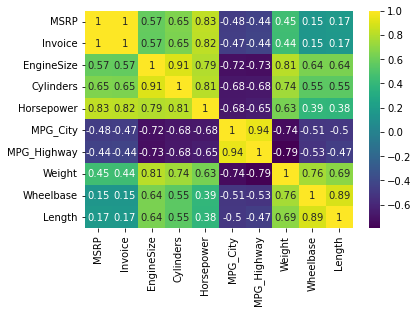

In [41]:
sns.heatmap(cars.corr(), annot=True, cmap='viridis');

In [42]:
cars.corr()['MSRP'].sort_values(ascending=False)

MSRP           1.000000
Invoice        0.999132
Horsepower     0.827296
Cylinders      0.649742
EngineSize     0.573238
Weight         0.447987
Length         0.171060
Wheelbase      0.151665
MPG_Highway   -0.440523
MPG_City      -0.475916
Name: MSRP, dtype: float64

We can observe that Invoice and Horsepower have significantly higher correlation with MSRP. However, we will ignore Invoice since it's just the same as price. 

## Next, to prepare the model before training.

In [43]:
cars.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426 entries, 0 to 427
Data columns (total 15 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Make         426 non-null    object 
 1   Model        426 non-null    object 
 2   Type         426 non-null    object 
 3   Origin       426 non-null    object 
 4   DriveTrain   426 non-null    object 
 5   MSRP         426 non-null    int64  
 6   Invoice      426 non-null    int64  
 7   EngineSize   426 non-null    float64
 8   Cylinders    426 non-null    float64
 9   Horsepower   426 non-null    int64  
 10  MPG_City     426 non-null    int64  
 11  MPG_Highway  426 non-null    int64  
 12  Weight       426 non-null    int64  
 13  Wheelbase    426 non-null    int64  
 14  Length       426 non-null    int64  
dtypes: float64(2), int64(8), object(5)
memory usage: 69.4+ KB


### Notice some of these column's data types are object. In order to use them during the model training, I will perform one-hot encoding for "Make", "Model", "Type", "Origin", and "DriveTrain"

One hot encoding is a technique used to represent categorical variables as numerical values in a machine learning model. Some advantages are:
- Allows the use of categorical variables in models that require numerical input.
- It can improve model performance by providing more information to the model about the categorical variable.
- Can help to avoid the problem of ordinality, which can occur when a categorical variable has a natural ordering.

And some disadvantages:
- It can lead to increased dimensionality, making the model more complex and slower to train.
- Can lead to sparse data as most observations will have a value of 0 in most of the one-hot encoded columns.
- It can lead to overfitting, especially if there are many categories in the variable and the sample size is relatively small.

In [44]:
df_dummies = pd.get_dummies(cars, columns=['Make', 'Model', 'Type', 'Origin', 'DriveTrain'])
df_dummies.head(2)

,MSRP,Invoice,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length,...,Type_Sedan,Type_Sports,Type_Truck,Type_Wagon,Origin_Asia,Origin_Europe,Origin_USA,DriveTrain_All,DriveTrain_Front,DriveTrain_Rear
0,36945,33337,3.5,6.0,265,17,23,4451,106,189,...,0,0,0,0,1,0,0,1,0,0
1,23820,21761,2.0,4.0,200,24,31,2778,101,172,...,1,0,0,0,1,0,0,0,1,0


### Since invoice column is similar to MSRP column, we will drop invoice.

In [45]:
df_data = df_dummies.drop(['Invoice'], axis=1)
df_data.head(1)

,MSRP,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length,Make_Acura,...,Type_Sedan,Type_Sports,Type_Truck,Type_Wagon,Origin_Asia,Origin_Europe,Origin_USA,DriveTrain_All,DriveTrain_Front,DriveTrain_Rear
0,36945,3.5,6.0,265,17,23,4451,106,189,1,...,0,0,0,0,1,0,0,1,0,0


### Separate features and labels.

In [46]:
#Label is the thing we're predicting, y. Feature is an input variable - X.
X = df_data.drop(['MSRP'], axis=1)
y = df_data['MSRP']
X

,EngineSize,Cylinders,Horsepower,MPG_City,MPG_Highway,Weight,Wheelbase,Length,Make_Acura,Make_Audi,...,Type_Sedan,Type_Sports,Type_Truck,Type_Wagon,Origin_Asia,Origin_Europe,Origin_USA,DriveTrain_All,DriveTrain_Front,DriveTrain_Rear
0,3.5,6.0,265,17,23,4451,106,189,1,0,...,0,0,0,0,1,0,0,1,0,0
1,2.0,4.0,200,24,31,2778,101,172,1,0,...,1,0,0,0,1,0,0,0,1,0
2,2.4,4.0,200,22,29,3230,105,183,1,0,...,1,0,0,0,1,0,0,0,1,0
3,3.2,6.0,270,20,28,3575,108,186,1,0,...,1,0,0,0,1,0,0,0,1,0
4,3.5,6.0,225,18,24,3880,115,197,1,0,...,1,0,0,0,1,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
423,2.4,5.0,197,21,28,3450,105,186,0,0,...,1,0,0,0,0,1,0,0,1,0
424,2.3,5.0,242,20,26,3450,105,186,0,0,...,1,0,0,0,0,1,0,0,1,0
425,2.9,6.0,268,19,26,3653,110,190,0,0,...,1,0,0,0,0,1,0,0,1,0
426,1.9,4.0,170,22,29,2822,101,180,0,0,...,0,0,0,1,0,1,0,0,1,0


In [47]:
y

0      36945
1      23820
2      26990
3      33195
4      43755
       ...  
423    40565
424    42565
425    45210
426    26135
427    35145
Name: MSRP, Length: 426, dtype: int64

## Train Test Split

Train test split is a model validation procedure that allows you to simulate how a model would perform on new/unseen data. So you first split the data set into two pieces - a training set and a testing set. This consists of random sampling without replacement for x percent of the rows and putting them into the training set. The remaining 100-x percent is put into your test set. Then you first train the model on the training set, the X_train and the y_train. Then you test the model on the testing set and evaluate the performance.

In our case here, I'll set 80% of the data to be the training data and 20% to be the testing data.

In [48]:
from sklearn.model_selection import train_test_split

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [50]:
X_train.shape, X_test.shape

((340, 481), (86, 481))

In [51]:
y_train.shape, y_test.shape

((340,), (86,))

# Multiple Linear Regression Model

### Before explaining what's multiple linear regression, let me explain the intuition behind simple linear regression. 

In simple linear regression, we predict the value of one variable Y based on another variable X. X is the independent variable and Y is the depndent variable. It's called simple because it only examines the relationship between two variables and linear because the relationship between the two variable are strictly linear, meaning when X increases/decreases, the Y also increases/decreases in a linear fashion.

Now onto multiple linear regression, the difference between the two is that multiple linear regression examines relationship between more than 2 variables. Now, each independent variable has its own corresponding coefficient.

How do I obtain the model parameters?
Least squares fitting is a way to find the best fit curve or line for a set of points. The sum of the squares of the offsets, or residuals, are used to estimate the best fit curve or line.

In [52]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [53]:
linear_regression_model = LinearRegression()
linear_regression_model.fit(X_train, y_train)
score_linear_regression = linear_regression_model.score(X_test, y_test)
score_linear_regression

0.8530027025998808

# Decision Tree & Random Forest Model

The intuition behind decision trees: 
It's a tree-shaped diagram used to determine a course of action. Each branch represents possible decision, occurence or reaction. The tree consists of decision nodes and leaves where the leaves are the decisions or the final outcomes and decision nodes are where the data is split based on a certain characteristic. The objective is to minimize the entropy which provides the optimum split.

The random forest regression we will use here is an ensemble learning method that operates by constructing a multitude of decision trees at training time. It creates a set of decision trees from randomly selected subset of training set and then combines all the predicted values from different decision trees and find the average of them.

Random deicision forests correct for decision trees' habit of overfitting to their training set. They generally outperform decision trees, but their accuracy is lower than gradient boosted trees.


### Some of the advantages of random forest model:

- Overcomes the overfitting problem by taking average of all the predictions, canceling out biases
- Runs effectively on larg database and produces highly accurate predictions
- Random Forest can maintain accuracy when a large proportion of data is missing

In [54]:
from sklearn.tree import DecisionTreeRegressor

In [55]:
decision_tree_model = DecisionTreeRegressor()
decision_tree_model.fit(X_train, y_train)
score_decision_tree = decision_tree_model.score(X_test, y_test)
round(score_decision_tree*100, 2)


84.48

In [56]:
from sklearn.ensemble import RandomForestRegressor

In [57]:
random_forest_model = RandomForestRegressor(n_estimators=5, max_depth=5)
random_forest_model.fit(X_train, y_train)

RandomForestRegressor(max_depth=5, n_estimators=5)

In [58]:
score_random_forest = random_forest_model.score(X_test, y_test)


round(score_random_forest*100, 2)

79.73

# XGBoost


XGBoost or extreme gradient boosting is the algorithm used for regression and classification tasks. It's a supervised learning algorithm that implements gradient boosted trees algorith, It works by combining an ensemble of predictions from several weak models. It is robust to many data distributions and relationships and offers many hyperparameters to tune model performance.

### What is boosting?
Boosting works by learning from previous mistakes / erros in model preictions to come up with better future predictions. Each model is trying to learn from the previous weak model and improve their predictions. Boosting algorithms work by building a model from the training data, then the second model is built based on the mistakes of the first model. The algorithm repeats until the maximum number of models have been created or until the model provides good enough predictions.

Gradient boosting is an extension of boosting where the process of additively generating weak models is formalized as a gradient descent algorithm over an objective function. Gradient boosting sets targeted outcomes for the next model in an effort to minimize errors. Targeted outcomes for each case are based on the gradient of the error with respect to the prediction. 

Gradient boosting decision trees iteratively train an ensemble of shallow decision trees, with each iteration using the error residuals of the previous model to fit the next model. The final prediction is a weighted sum of all of the tree predictions. Random forest minimizes the variance and overfitting while GBDT minimizes the bias and underfitting.

In [59]:
from xgboost import XGBRegressor

In [60]:
xgb_model = XGBRegressor()
xgb_model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=100, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [61]:
xgb_score = xgb_model.score(X_test, y_test)
round(xgb_score*100, 2)

84.43

## Compare Models and Regression Metrics

Helper function for plotting and getting mean absolute error, mean squared error, root mean square error, and the R squared score.

In [62]:
def plot_results(model, model_type, y_pred, y_true, color, marker):
    fig = sns.regplot(x=y_pred, y=y_test, color=color, marker=marker)
    fig.set(title=model_type, xlabel='Predicted Price of Used Cars($)', ylabel='Actual Price of the used cars ($)')

In [63]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

def get_score(y_pred, y_true):
    MAE = round(mean_absolute_error(y_pred, y_true), 2)
    MSE = round(mean_squared_error(y_pred, y_true), 2)
    RMSE = round(np.sqrt(MSE), 2)
    r2 = round(r2_score(y_pred, y_true), 2)
    
    print('MAE: ', MAE)
    print('MSE: ', MSE)
    print('RMSE: ', RMSE)
    print('R^2 Score: ', r2)

## Linear Regression Model

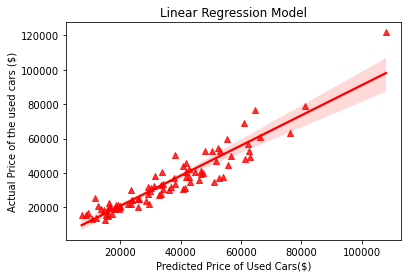

In [64]:
predictions_linear_regression = linear_regression_model.predict(X_test)
plot_results(linear_regression_model, 'Linear Regression Model', predictions_linear_regression, y_test, 'red', '^')

In [65]:
get_score(predictions_linear_regression, y_test)

MAE:  5212.5
MSE:  45513010.69
RMSE:  6746.33
R^2 Score:  0.87


## Random Forest Model

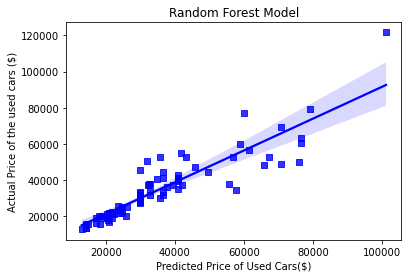

In [66]:
predictions_random_forest = random_forest_model.predict(X_test)
plot_results(random_forest_model, 'Random Forest Model', predictions_random_forest, y_test, 'blue', 's')

In [67]:
get_score(predictions_random_forest, y_test)

MAE:  4767.38
MSE:  62774710.81
RMSE:  7923.05
R^2 Score:  0.81


## XGBoost Model

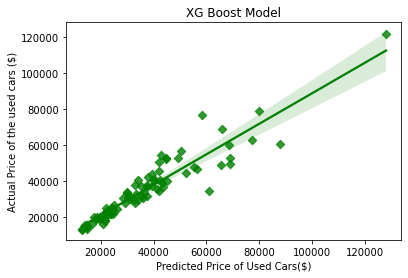

In [68]:
predictions_XGBoost = xgb_model.predict(X_test)
plot_results(xgb_model, 'XG Boost Model', predictions_XGBoost, y_test, 'green', 'D')

In [69]:
get_score(predictions_XGBoost, y_test)

MAE:  4373.79
MSE:  48203566.11
RMSE:  6942.88
R^2 Score:  0.87
